## Cell 1: Environment & Reproducibility

In [1]:
import os
import warnings

# Suppress ALL warnings and logs (must be set BEFORE importing TensorFlow)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"  # 3 = suppress all logs (INFO, WARNING, ERROR)
os.environ["PYTHONHASHSEED"] = "42"
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"  # Disable oneDNN custom operations
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"  # Explicitly set GPU devices
warnings.filterwarnings("ignore")

import random
import numpy as np
import tensorflow as tf
from tensorflow.keras import mixed_precision
import logging

# Suppress TensorFlow logging completely
logging.getLogger("tensorflow").setLevel(logging.ERROR)
tf.get_logger().setLevel(logging.ERROR)
tf.autograph.set_verbosity(0)

# Set seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Enable mixed precision
policy = mixed_precision.Policy("mixed_float16")
mixed_precision.set_global_policy(policy)

# Configure GPU memory growth (silently)
gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print(f"✓ GPU memory growth enabled for {len(gpus)} GPU(s)")
    except RuntimeError as e:
        print(f"✗ GPU configuration error: {e}")
else:
    print("⚠ No GPU detected — running on CPU")

print(f"✓ Seeds set to {SEED}")
print(f"✓ TensorFlow: {tf.__version__}")
print(f"✓ Precision policy: {policy.name}")
print("✓ All logging suppressed - clean training output enabled")

E0000 00:00:1762017712.607521      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762017712.728640      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


✓ GPU memory growth enabled for 2 GPU(s)
✓ Seeds set to 42
✓ TensorFlow: 2.18.0
✓ Precision policy: mixed_float16
✓ All logging suppressed - clean training output enabled


## Viewing the Dataset & its NDVI format

Keys in the HDF image file: ['img']
Input image data shape: (128, 128, 14)
RGB image shape: (128, 128, 3)
Data NDVI shape: (128, 128) f_data shape: (1, 128, 128, 1)


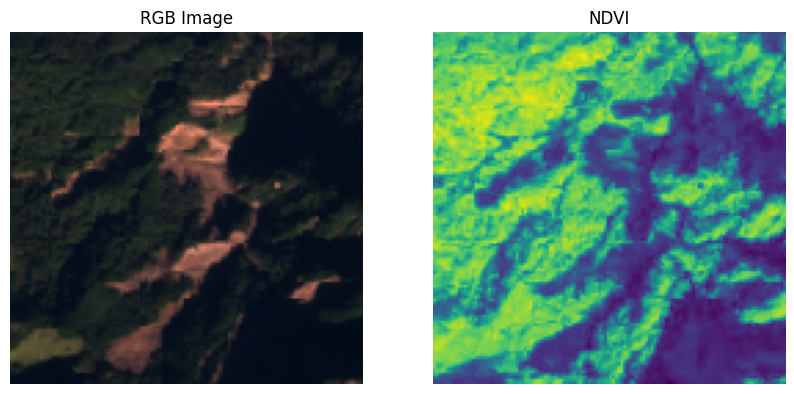

In [2]:
import numpy as np
import h5py
import matplotlib.pyplot as plt

f_data = np.zeros((1, 128, 128, 1))

path_single = "/kaggle/input/TrainData/img/image_1045.h5"
path_single_mask = "/kaggle/input/TrainData/mask/mask_1045.h5"

with h5py.File(path_single, 'r') as hdf:
    ls = list(hdf.keys())
    print("Keys in the HDF image file:", ls)
    
    data = np.array(hdf.get('img'))
    print("Input image data shape:", data.shape)

    # Extract channels
    data_red = data[:, :, 3]
    data_green = data[:, :, 2]
    data_blue = data[:, :, 1]
    data_nir = data[:, :, 7]

    # Build RGB image (stack R, G, B in correct order)
    data_rgb = np.dstack((data_red, data_green, data_blue))

    # Normalize RGB for display (optional: values may not be in 0-1 range)
    rgb_display = (data_rgb - np.min(data_rgb)) / (np.max(data_rgb) - np.min(data_rgb))

    # Compute NDVI
    data_ndvi = np.divide(
        data_nir - data_red,
        data_nir + data_red,
        out=np.zeros_like(data_nir, dtype=float),
        where=(data_nir + data_red) != 0
    )
    f_data[0, :, :, 0] = data_ndvi

    print("RGB image shape:", data_rgb.shape)
    print("Data NDVI shape:", data_ndvi.shape, "f_data shape:", f_data.shape)

    # Plot results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("RGB Image")
    plt.imshow(rgb_display)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("NDVI")
    plt.imshow(data_ndvi)
    plt.axis("off")

    plt.show()


## Viewing its Respective Landslide Mask

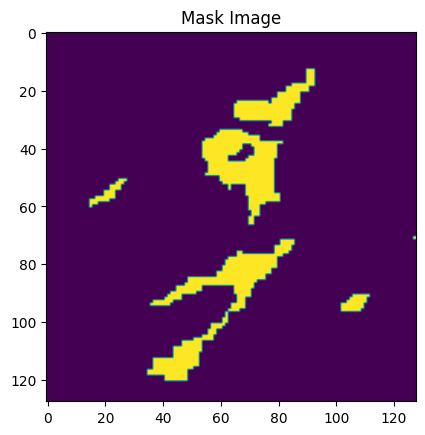

In [3]:
with h5py.File(path_single_mask, 'r') as hdf:
    data_mask = np.array(hdf.get('mask'))
    plt.imshow(data_mask)
    plt.title('Mask Image')
    plt.show()

## Cell 2: Training Configuration

In [4]:
import cv2

# Training hyperparameters
NUM_MODELS = 5
BATCH_SIZE = 16
MAX_EPOCHS = 100

# Preprocessing configuration - REVERTED to original aggressive enhancement
PREPROCESS_CONFIG = {
    "percentile_lower": 1.5,  # Back to original
    "percentile_upper": 99.2,  # Back to original
    "clahe_clip_limit": 3.0,  # Back to original - needed for contrast
    "clahe_tile_size": (8, 8),
    "ndvi_min_threshold": 0.15,
    "ndvi_range": 0.35,
    "veg_mask_gamma": 0.70,
    "veg_blur_kernel": (5, 5),
    "veg_blur_sigma": 0.8,
    "canny_low_threshold": 30,
    "canny_high_threshold": 120,
    "canny_aperture": 3,
    "log_sigma": 1.2,
    "log_kernel_size": 7,
    "scharr_scale": 1.0,
    "scharr_delta": 0,
    "edge_canny_weight": 0.35,
    "edge_log_weight": 0.40,
    "edge_scharr_weight": 0.25,
    "veg_edge_suppress_factor": 0.60,
    "morph_kernel_size": (3, 3),
    "morph_kernel_type": cv2.MORPH_ELLIPSE,
    "unsharp_blur_sigma": 1.4,
    "unsharp_strength": 2.4,  # Back to original
    "bilateral_d": 5,
    "bilateral_sigma_color": 30,
    "bilateral_sigma_space": 30,
    "lab_a_boost": 1.05,  # Back to original
    "lab_b_boost": 1.03,  # Back to original
    "hsv_saturation_boost": 1.15,  # Back to original
    "hsv_value_boost": 1.08,  # Back to original
}

print("=" * 70)
print("CONFIGURATION LOADED")
print("=" * 70)
print(f"Training Models  : {NUM_MODELS}")
print(f"Batch Size       : {BATCH_SIZE}")
print(f"Max Epochs       : {MAX_EPOCHS}")
print(f"Preprocessing    : {len(PREPROCESS_CONFIG)} parameters")
print("=" * 70)

CONFIGURATION LOADED
Training Models  : 5
Batch Size       : 16
Max Epochs       : 100
Preprocessing    : 31 parameters


## Cell 3: Preprocessing Functions

In [5]:
import numpy as np
import cv2

def clip_and_normalize(band: np.ndarray, config: dict = None) -> np.ndarray:
    """Percentile clipping + [0,1] normalization."""
    if config is None:
        config = PREPROCESS_CONFIG
    band = band.astype(np.float32)
    low, high = np.percentile(band, (config["percentile_lower"], config["percentile_upper"]))
    clipped = np.clip(band, low, high)
    mn, mx = float(clipped.min()), float(clipped.max())
    return (clipped - mn) / (mx - mn + 1e-6)

def compute_canny_edges(luminance: np.ndarray, config: dict) -> np.ndarray:
    """Canny edge detection."""
    lum_uint8 = (luminance * 255).astype(np.uint8)
    edges = cv2.Canny(lum_uint8, config["canny_low_threshold"], 
                      config["canny_high_threshold"], 
                      apertureSize=config["canny_aperture"], L2gradient=True)
    return edges.astype(np.float32) / 255.0

def compute_log_edges(luminance: np.ndarray, config: dict) -> np.ndarray:
    """Laplacian of Gaussian edge detection."""
    blurred = cv2.GaussianBlur(luminance, (0, 0), config["log_sigma"])
    lap = cv2.Laplacian(blurred, cv2.CV_32F, ksize=config["log_kernel_size"])
    log_edges = np.abs(lap)
    log_edges = log_edges / (np.percentile(log_edges, 99.0) + 1e-6)
    return np.clip(log_edges, 0, 1).astype(np.float32)

def compute_scharr_edges(luminance: np.ndarray, config: dict) -> np.ndarray:
    """Scharr gradient magnitude."""
    gx = cv2.Scharr(luminance, cv2.CV_32F, 1, 0, 
                    scale=config["scharr_scale"], delta=config["scharr_delta"])
    gy = cv2.Scharr(luminance, cv2.CV_32F, 0, 1, 
                    scale=config["scharr_scale"], delta=config["scharr_delta"])
    mag = np.sqrt(gx**2 + gy**2)
    mag = mag / (np.percentile(mag, 99.5) + 1e-6)
    return np.clip(mag, 0, 1).astype(np.float32)

def enhance_satellite_image(rgb_norm: np.ndarray, red_norm: np.ndarray, 
                           nir_norm: np.ndarray, config: dict = None) -> dict:
    """Edge-aware enhancement with vegetation suppression."""
    if config is None:
        config = PREPROCESS_CONFIG
    
    rgb_norm = np.clip(rgb_norm, 0.0, 1.0).astype(np.float32)
    red_norm = np.clip(red_norm, 0.0, 1.0).astype(np.float32)
    nir_norm = np.clip(nir_norm, 0.0, 1.0).astype(np.float32)
    
    # Compute NDVI and vegetation mask
    ndvi = np.divide(nir_norm - red_norm, nir_norm + red_norm,
                     out=np.zeros_like(nir_norm, dtype=np.float32),
                     where=(nir_norm + red_norm) > 1e-6)
    ndvi = np.clip(ndvi, -1.0, 1.0)
    
    veg_mask = np.clip((ndvi - config["ndvi_min_threshold"]) / config["ndvi_range"], 0, 1)
    veg_mask = np.power(veg_mask, config["veg_mask_gamma"])
    veg_mask = cv2.GaussianBlur(veg_mask, config["veg_blur_kernel"], config["veg_blur_sigma"])
    
    # LAB color space + CLAHE on L channel
    rgb_uint8 = (rgb_norm * 255).astype(np.uint8)
    lab = cv2.cvtColor(rgb_uint8, cv2.COLOR_RGB2LAB)
    l_channel, a_channel, b_channel = cv2.split(lab)
    
    clahe = cv2.createCLAHE(clipLimit=config["clahe_clip_limit"], 
                            tileGridSize=config["clahe_tile_size"])
    l_clahe = clahe.apply(l_channel)
    l_float = l_clahe.astype(np.float32) / 255.0
    
    # Multi-edge fusion
    edges_canny = compute_canny_edges(l_float, config)
    edges_log = compute_log_edges(l_float, config)
    edges_scharr = compute_scharr_edges(l_float, config)
    
    edge_combined = np.clip(
        edges_canny * config["edge_canny_weight"] +
        edges_log * config["edge_log_weight"] +
        edges_scharr * config["edge_scharr_weight"], 0, 1
    )
    
    # Vegetation-aware edge suppression
    veg_suppress = 1.0 - veg_mask * config["veg_edge_suppress_factor"]
    edge_terrain = np.clip(edge_combined * veg_suppress, 0, 1)
    
    # Morphological closing
    edge_uint8 = (edge_terrain * 255).astype(np.uint8)
    kernel = cv2.getStructuringElement(config["morph_kernel_type"], 
                                       config["morph_kernel_size"])
    edge_closed = cv2.morphologyEx(edge_uint8, cv2.MORPH_CLOSE, kernel)
    edge_response = edge_closed.astype(np.float32) / 255.0
    
    # Unsharp masking guided by edges
    base_blur = cv2.GaussianBlur(l_float, (0, 0), config["unsharp_blur_sigma"])
    unsharp_mask = l_float - base_blur
    terrain_boost = edge_response * veg_suppress
    l_sharpened = np.clip(l_float + unsharp_mask * terrain_boost * config["unsharp_strength"], 0, 1)
    
    # Bilateral filtering
    l_final = cv2.bilateralFilter(
        (l_sharpened * 255).astype(np.uint8),
        d=config["bilateral_d"],
        sigmaColor=config["bilateral_sigma_color"],
        sigmaSpace=config["bilateral_sigma_space"]
    ).astype(np.float32) / 255.0
    
    # Color enhancement in LAB space
    a_shift = np.clip((a_channel.astype(np.float32) - 128.0) * config["lab_a_boost"], -120, 120) + 128.0
    b_shift = np.clip((b_channel.astype(np.float32) - 128.0) * config["lab_b_boost"], -120, 120) + 128.0
    lab_refined = cv2.merge([(l_final * 255).astype(np.uint8), 
                             a_shift.astype(np.uint8), 
                             b_shift.astype(np.uint8)])
    rgb_refined = cv2.cvtColor(lab_refined, cv2.COLOR_LAB2RGB).astype(np.float32) / 255.0
    
    # HSV color boost
    hsv = cv2.cvtColor((rgb_refined * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = np.clip(s.astype(np.float32) * config["hsv_saturation_boost"], 0, 255).astype(np.uint8)
    v = np.clip(v.astype(np.float32) * config["hsv_value_boost"], 0, 255).astype(np.uint8)
    hsv_final = cv2.merge([h, s, v])
    rgb_enhanced = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2RGB).astype(np.float32) / 255.0
    
    return {
        "rgb_enhanced": rgb_enhanced,
        "edge_response": edge_response,
        "veg_mask": veg_mask,
        "ndvi": ndvi,
    }

print("✓ Preprocessing functions loaded")
print("✓ Edge detectors: Canny + LoG + Scharr")
print("✓ Multi-scale enhancement pipeline ready")

✓ Preprocessing functions loaded
✓ Edge detectors: Canny + LoG + Scharr
✓ Multi-scale enhancement pipeline ready


## Cell 4: Load & Preprocess Training Data

In [6]:

import glob
import h5py
from tqdm import tqdm
from scipy import ndimage
import matplotlib.pyplot as plt

# Data paths - update these to match your dataset location
TRAIN_PATH = "/kaggle/input/TrainData/img/*.h5"
TRAIN_MASK_PATH = "/kaggle/input/TrainData/mask/*.h5"

all_train_files = sorted(glob.glob(TRAIN_PATH))
all_mask_files = sorted(glob.glob(TRAIN_MASK_PATH))

if len(all_train_files) != len(all_mask_files):
    raise ValueError(f"Mismatch: {len(all_train_files)} images != {len(all_mask_files)} masks")

num_images = len(all_train_files)
print(f"Loading and preprocessing {num_images} training images...")

# Initialize arrays: X=[R_enh, G_enh, B_enh, NDVI, Slope, Elev, SWIR1, SWIR2, Edge, VegMask]
TRAIN_XX = np.zeros((num_images, 128, 128, 10), dtype=np.float32)
TRAIN_YY = np.zeros((num_images, 128, 128, 1), dtype=np.float32)

# Process all images
for idx in tqdm(range(num_images), desc="Processing"):
    # Load image and mask
    with h5py.File(all_train_files[idx], "r") as hdf:
        data = np.array(hdf["img"])
    with h5py.File(all_mask_files[idx], "r") as hdf:
        mask = np.array(hdf["mask"])
    
    # Extract and normalize bands
    red = clip_and_normalize(data[:, :, 3])
    green = clip_and_normalize(data[:, :, 2])
    blue = clip_and_normalize(data[:, :, 1])
    nir = clip_and_normalize(data[:, :, 7])
    swir1 = clip_and_normalize(data[:, :, 11])
    swir2 = clip_and_normalize(data[:, :, 12])
    
    # Apply enhancement pipeline
    rgb_norm = np.dstack([red, green, blue]).astype(np.float32)
    enhancement = enhance_satellite_image(rgb_norm, red, nir)
    rgb_enhanced = enhancement["rgb_enhanced"]
    ndvi = enhancement["ndvi"]
    edge_response = enhancement["edge_response"]
    veg_mask = enhancement["veg_mask"]
    
    # Compute slope and elevation proxies
    elevation_proxy = nir
    gx = ndimage.sobel(elevation_proxy, axis=1)
    gy = ndimage.sobel(elevation_proxy, axis=0)
    slope = clip_and_normalize(np.sqrt(gx**2 + gy**2))
    elevation = clip_and_normalize(elevation_proxy)
    
    # Stack all 10 channels
    TRAIN_XX[idx, :, :, 0:3] = rgb_enhanced
    TRAIN_XX[idx, :, :, 3] = ndvi
    TRAIN_XX[idx, :, :, 4] = slope
    TRAIN_XX[idx, :, :, 5] = elevation
    TRAIN_XX[idx, :, :, 6] = swir1
    TRAIN_XX[idx, :, :, 7] = swir2
    TRAIN_XX[idx, :, :, 8] = edge_response
    TRAIN_XX[idx, :, :, 9] = veg_mask
    
    TRAIN_YY[idx, :, :, 0] = mask.astype(np.float32)

print(f"✓ Data loaded: X={TRAIN_XX.shape}, Y={TRAIN_YY.shape}")
if len(TRAIN_XX) > 0:
    print(f"✓ X range: [{TRAIN_XX.min():.4f}, {TRAIN_XX.max():.4f}]")
    print(f"✓ Y unique: {np.unique(TRAIN_YY)}")
else:
    print("⚠ WARNING: No images loaded. Please check your data paths!")


Loading and preprocessing 3799 training images...


Processing: 100%|██████████| 3799/3799 [03:23<00:00, 18.67it/s]


✓ Data loaded: X=(3799, 128, 128, 10), Y=(3799, 128, 128, 1)
✓ X range: [-1.0000, 1.0000]
✓ Y unique: [0. 1.]


## Cell 5: Visualize Preprocessed Data

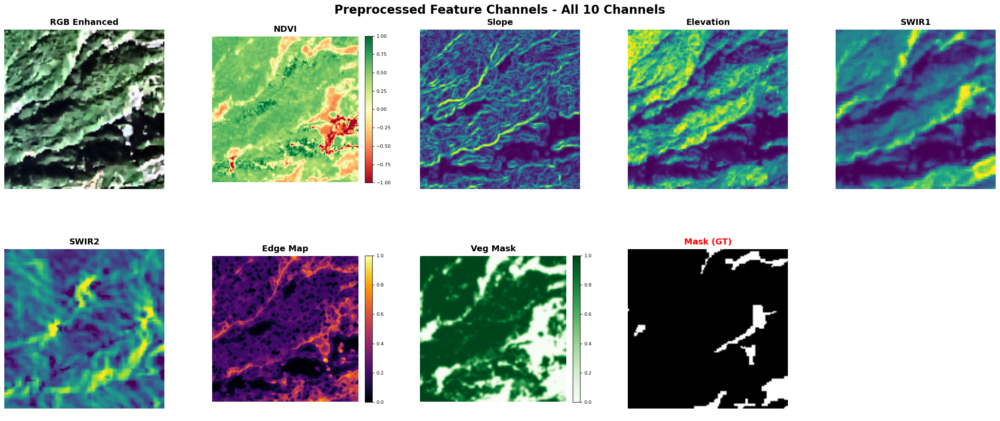


VISUALIZATION SUMMARY - Sample #234
  RGB Enhanced   : Range [0.000, 1.000]
  NDVI           : Range [-1.000, 1.000]
  Slope          : Range [0.000, 1.000]
  Elevation      : Range [0.000, 1.000]
  SWIR1          : Range [0.000, 1.000]
  SWIR2          : Range [0.000, 1.000]
  Edge Response  : Range [0.000, 0.965]
  Veg Mask       : Range [0.000, 1.000]
  Ground Truth   : Unique values [0. 1.]
✓ All 10 feature channels visualized with proper spacing


In [7]:
sample_idx = 234

# Create figure with better spacing
fig, axes = plt.subplots(2, 5, figsize=(24, 10))
fig.suptitle('Preprocessed Feature Channels - All 10 Channels', 
             fontsize=20, fontweight='bold', y=0.98)

titles = ["RGB Enhanced", "NDVI", "Slope", "Elevation", "SWIR1", 
          "SWIR2", "Edge Map", "Veg Mask", "Mask (GT)", ""]

channels = [
    TRAIN_XX[sample_idx, :, :, :3],   # RGB Enhanced
    TRAIN_XX[sample_idx, :, :, 3],    # NDVI
    TRAIN_XX[sample_idx, :, :, 4],    # Slope
    TRAIN_XX[sample_idx, :, :, 5],    # Elevation
    TRAIN_XX[sample_idx, :, :, 6],    # SWIR1
    TRAIN_XX[sample_idx, :, :, 7],    # SWIR2
    TRAIN_XX[sample_idx, :, :, 8],    # Edge Response
    TRAIN_XX[sample_idx, :, :, 9],    # Vegetation Mask
    TRAIN_YY[sample_idx, :, :, 0],    # Ground Truth Mask
    None                               # Empty slot
]

axes_flat = axes.flatten()

for i, (ax, title, ch) in enumerate(zip(axes_flat, titles, channels)):
    if ch is None:
        ax.axis('off')
        continue
        
    if ch.ndim == 3:
        # RGB image
        im = ax.imshow(ch, interpolation='bilinear')
        ax.set_title(title, fontsize=14, fontweight='bold', pad=8)
    else:
        # Single channel with appropriate colormap
        if title == "Mask (GT)":
            im = ax.imshow(ch, cmap="gray", vmin=0, vmax=1, interpolation='bilinear')
            ax.set_title(title, fontsize=14, fontweight='bold', pad=8, color='red')
        elif title == "NDVI":
            im = ax.imshow(ch, cmap="RdYlGn", vmin=-1, vmax=1, interpolation='bilinear')
            ax.set_title(title, fontsize=14, fontweight='bold', pad=8)
            # Add colorbar
            cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=8)
        elif title == "Edge Map":
            im = ax.imshow(ch, cmap="inferno", vmin=0, vmax=1, interpolation='bilinear')
            ax.set_title(title, fontsize=14, fontweight='bold', pad=8)
            # Add colorbar
            cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=8)
        elif title == "Veg Mask":
            im = ax.imshow(ch, cmap="Greens", vmin=0, vmax=1, interpolation='bilinear')
            ax.set_title(title, fontsize=14, fontweight='bold', pad=8)
            # Add colorbar
            cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(labelsize=8)
        else:
            im = ax.imshow(ch, cmap="viridis", vmin=0, vmax=1, interpolation='bilinear')
            ax.set_title(title, fontsize=14, fontweight='bold', pad=8)
    
    ax.axis("off")

# Adjust layout to prevent overlap
plt.subplots_adjust(top=0.94, bottom=0.02, left=0.02, right=0.98, 
                    hspace=0.25, wspace=0.3)
plt.show()

print(f"\n{'='*70}")
print(f"VISUALIZATION SUMMARY - Sample #{sample_idx}")
print(f"{'='*70}")
print(f"  RGB Enhanced   : Range [{TRAIN_XX[sample_idx, :, :, :3].min():.3f}, {TRAIN_XX[sample_idx, :, :, :3].max():.3f}]")
print(f"  NDVI           : Range [{TRAIN_XX[sample_idx, :, :, 3].min():.3f}, {TRAIN_XX[sample_idx, :, :, 3].max():.3f}]")
print(f"  Slope          : Range [{TRAIN_XX[sample_idx, :, :, 4].min():.3f}, {TRAIN_XX[sample_idx, :, :, 4].max():.3f}]")
print(f"  Elevation      : Range [{TRAIN_XX[sample_idx, :, :, 5].min():.3f}, {TRAIN_XX[sample_idx, :, :, 5].max():.3f}]")
print(f"  SWIR1          : Range [{TRAIN_XX[sample_idx, :, :, 6].min():.3f}, {TRAIN_XX[sample_idx, :, :, 6].max():.3f}]")
print(f"  SWIR2          : Range [{TRAIN_XX[sample_idx, :, :, 7].min():.3f}, {TRAIN_XX[sample_idx, :, :, 7].max():.3f}]")
print(f"  Edge Response  : Range [{TRAIN_XX[sample_idx, :, :, 8].min():.3f}, {TRAIN_XX[sample_idx, :, :, 8].max():.3f}]")
print(f"  Veg Mask       : Range [{TRAIN_XX[sample_idx, :, :, 9].min():.3f}, {TRAIN_XX[sample_idx, :, :, 9].max():.3f}]")
print(f"  Ground Truth   : Unique values {np.unique(TRAIN_YY[sample_idx])}")
print(f"{'='*70}")
print(f"✓ All 10 feature channels visualized with proper spacing")

## Cell 5B: Satellite Imagery Enhancement Overview 

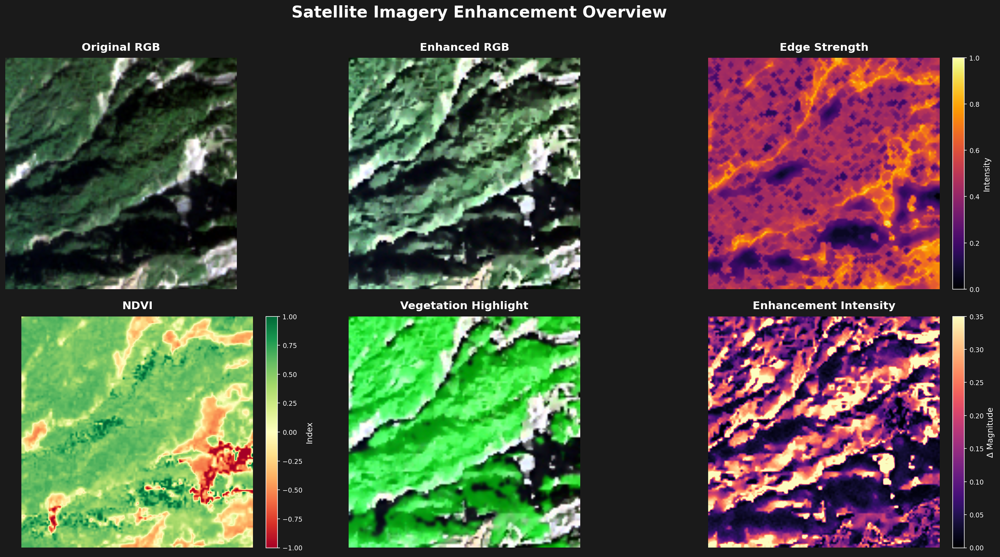


ENHANCEMENT STATISTICS - Sample #234
  NDVI range          : [-1.000, 1.000]
  Mean NDVI           : 0.369
  Edge coverage (>0.4): 12.4%
  Edge mean intensity : 0.223
  Vegetation (>0.35)  : 78.6%
  Mean enhancement Δ  : 0.1523
  Max enhancement Δ   : 0.7595


In [8]:
s = 234

# Re-load and process sample for complete visualization
with h5py.File(all_train_files[s], "r") as hdf:
    data_s = np.array(hdf["img"])

# Extract and normalize raw bands
red_s = clip_and_normalize(data_s[:, :, 3])
green_s = clip_and_normalize(data_s[:, :, 2])
blue_s = clip_and_normalize(data_s[:, :, 1])
nir_s = clip_and_normalize(data_s[:, :, 7])

# Original RGB (with better contrast)
rgb_original = np.dstack([red_s, green_s, blue_s]).astype(np.float32)

# Apply enhancement pipeline
enhancement = enhance_satellite_image(rgb_original, red_s, nir_s)
rgb_enhanced = enhancement["rgb_enhanced"]
ndvi = enhancement["ndvi"]
veg_mask = enhancement["veg_mask"]
edge_response = enhancement["edge_response"]

# Create vegetation highlight with stronger visual effect
veg_strength = veg_mask[..., None]
veg_boost = np.zeros_like(rgb_enhanced)
veg_boost[:, :, 0] = np.clip(rgb_enhanced[:, :, 0] * (1 - veg_mask * 0.6), 0, 1)  # Reduce red more
veg_boost[:, :, 1] = np.clip(rgb_enhanced[:, :, 1] + veg_mask * 0.8, 0, 1)  # Boost green more
veg_boost[:, :, 2] = np.clip(rgb_enhanced[:, :, 2] * (1 - veg_mask * 0.5), 0, 1)  # Reduce blue more
rgb_vegetation = np.clip(rgb_enhanced * (1 - veg_strength * 0.5) + veg_boost * (veg_strength * 0.7), 0, 1)

# Edge display with better contrast
edge_display = np.clip(np.power(edge_response, 0.5), 0, 1)  # Lower gamma for more contrast

# Enhancement intensity
diff_map = np.mean(np.abs(rgb_enhanced - rgb_original), axis=2)
diff_map = np.clip(diff_map, 0, 1)

# Create high-quality visualization with dark background
plt.style.use('dark_background')
fig = plt.figure(figsize=(20, 11), facecolor='#1a1a1a', dpi=150)
fig.suptitle('Satellite Imagery Enhancement Overview', 
             fontsize=22, fontweight='bold', color='white', y=0.96)

# Row 1: Original RGB, Enhanced RGB, Edge Strength
ax1 = plt.subplot(2, 3, 1)
ax1.imshow(rgb_original, interpolation='bilinear')
ax1.set_title('Original RGB', fontsize=15, fontweight='bold', pad=10, color='white')
ax1.axis('off')

ax2 = plt.subplot(2, 3, 2)
ax2.imshow(rgb_enhanced, interpolation='bilinear')
ax2.set_title('Enhanced RGB', fontsize=15, fontweight='bold', pad=10, color='white')
ax2.axis('off')

ax3 = plt.subplot(2, 3, 3)
im3 = ax3.imshow(edge_display, cmap='inferno', vmin=0, vmax=1, interpolation='bilinear')
ax3.set_title('Edge Strength', fontsize=15, fontweight='bold', pad=10, color='white')
ax3.axis('off')
cbar3 = plt.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)
cbar3.set_label('Intensity', fontsize=11, color='white')
cbar3.ax.tick_params(labelsize=9, colors='white')

# Row 2: NDVI, Vegetation Highlight, Enhancement Intensity
ax4 = plt.subplot(2, 3, 4)
im4 = ax4.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1, interpolation='bilinear')
ax4.set_title('NDVI', fontsize=15, fontweight='bold', pad=10, color='white')
ax4.axis('off')
cbar4 = plt.colorbar(im4, ax=ax4, fraction=0.046, pad=0.04)
cbar4.set_label('Index', fontsize=11, color='white')
cbar4.ax.tick_params(labelsize=9, colors='white')

ax5 = plt.subplot(2, 3, 5)
ax5.imshow(rgb_vegetation, interpolation='bilinear')
ax5.set_title('Vegetation Highlight', fontsize=15, fontweight='bold', pad=10, color='white')
ax5.axis('off')

ax6 = plt.subplot(2, 3, 6)
im6 = ax6.imshow(diff_map, cmap='magma', vmin=0, vmax=0.35, interpolation='bilinear')
ax6.set_title('Enhancement Intensity', fontsize=15, fontweight='bold', pad=10, color='white')
ax6.axis('off')
cbar6 = plt.colorbar(im6, ax=ax6, fraction=0.046, pad=0.04)
cbar6.set_label('Δ Magnitude', fontsize=11, color='white')
cbar6.ax.tick_params(labelsize=9, colors='white')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Reset style for subsequent plots
plt.style.use('default')

# Print enhancement statistics
print(f"\n{'='*70}")
print(f"ENHANCEMENT STATISTICS - Sample #{s}")
print(f"{'='*70}")
print(f"  NDVI range          : [{ndvi.min():.3f}, {ndvi.max():.3f}]")
print(f"  Mean NDVI           : {ndvi.mean():.3f}")
print(f"  Edge coverage (>0.4): {(edge_response > 0.4).mean() * 100:.1f}%")
print(f"  Edge mean intensity : {edge_response.mean():.3f}")
print(f"  Vegetation (>0.35)  : {(veg_mask > 0.35).mean() * 100:.1f}%")
print(f"  Mean enhancement Δ  : {diff_map.mean():.4f}")
print(f"  Max enhancement Δ   : {diff_map.max():.4f}")
print(f"{'='*70}")

## Cell 6: Landslide Distribution & Oversampling

In [9]:
# Identify landslide samples
has_landslide = np.array([np.sum(TRAIN_YY[i]) > 0 for i in range(len(TRAIN_YY))])
indices_landslide = np.where(has_landslide)[0]
num_landslide = len(indices_landslide)
num_no_landslide = len(TRAIN_YY) - num_landslide

print("[Dataset Distribution]")
print(f"  With landslides    : {num_landslide:,}")
print(f"  Without landslides : {num_no_landslide:,}")
print(f"  Positive ratio     : {num_landslide / len(TRAIN_YY) * 100:.2f}%")

# Oversample positive class by 2.0x
oversample_factor = 1.5
integer_factor = int(oversample_factor)
fractional_factor = oversample_factor - integer_factor

# Replicate integer times
oversampled_indices = np.repeat(indices_landslide, integer_factor)

# Add fractional part
extra_samples = int(len(indices_landslide) * fractional_factor)
additional_indices = np.random.choice(indices_landslide, extra_samples, replace=False)

# Combine
final_oversampled_indices = np.concatenate([oversampled_indices, additional_indices])
TRAIN_XX_landslide = TRAIN_XX[final_oversampled_indices]
TRAIN_YY_landslide = TRAIN_YY[final_oversampled_indices]

print(f"\n[Oversampling Results]")
print(f"  Factor             : {oversample_factor}x")
print(f"  Original positives : {num_landslide:,}")
print(f"  Augmented positives: {len(TRAIN_XX_landslide):,}")
print(f"  Added samples      : {len(TRAIN_XX_landslide) - num_landslide:,}")

[Dataset Distribution]
  With landslides    : 2,231
  Without landslides : 1,568
  Positive ratio     : 58.73%

[Oversampling Results]
  Factor             : 1.5x
  Original positives : 2,231
  Augmented positives: 3,346
  Added samples      : 1,115


## Cell 7: Stratified Train/Val/Test Split

In [10]:
from sklearn.model_selection import train_test_split
import numpy as np

# Combine original + oversampled data
X_full = np.concatenate([TRAIN_XX, TRAIN_XX_landslide], axis=0)
Y_full = np.concatenate([TRAIN_YY, TRAIN_YY_landslide], axis=0)

# Binary labels for stratification
labels_full = (Y_full.sum(axis=(1, 2, 3)) > 0).astype(np.uint8)

# ---- Split 1: Train (72%) vs Temp (28%) ----
x_train, x_temp, y_train, y_temp, labels_train, labels_temp = train_test_split(
    X_full, Y_full, labels_full,
    test_size=0.28,          # 100 - 72 = 28
    random_state=42,
    stratify=labels_full
)

# ---- Split 2: Temp -> Validation (8%) + Test (20%) ----
x_valid, x_test, y_valid, y_test = train_test_split(
    x_temp, y_temp,
    test_size=0.7142857,     # = 20 / 28
    random_state=42,
    stratify=labels_temp
)

# Ensure float32 dtype
x_train = x_train.astype(np.float32)
x_valid = x_valid.astype(np.float32)
x_test = x_test.astype(np.float32)
y_train = y_train.astype(np.float32)
y_valid = y_valid.astype(np.float32)
y_test = y_test.astype(np.float32)

# Summary function
def landslide_ratio(y):
    return float((y.sum(axis=(1, 2, 3)) > 0).mean() * 100.0)

print("[Dataset Split]")
print(f"  Train: {len(x_train):,} samples | Landslide ratio: {landslide_ratio(y_train):.1f}%")
print(f"  Valid: {len(x_valid):,} samples | Landslide ratio: {landslide_ratio(y_valid):.1f}%")
print(f"  Test : {len(x_test):,} samples | Landslide ratio: {landslide_ratio(y_test):.1f}%")


[Dataset Split]
  Train: 5,144 samples | Landslide ratio: 78.1%
  Valid: 571 samples | Landslide ratio: 78.1%
  Test : 1,430 samples | Landslide ratio: 78.0%


## Cell 8: Memory Cleanup

In [11]:
import gc

# Delete large intermediate arrays
del TRAIN_XX, TRAIN_YY, TRAIN_XX_landslide, TRAIN_YY_landslide
del X_full, Y_full, labels_full, labels_temp, x_temp, y_temp

gc.collect()
print("✓ Memory freed - intermediate arrays deleted")

✓ Memory freed - intermediate arrays deleted


## Cell 9: Model Architecture & Loss Functions

In [12]:
from tensorflow.keras import backend as K
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate,
    BatchNormalization, Activation, Dropout, Reshape, 
    LayerNormalization, MultiHeadAttention
)

# ========== Metrics & Loss Functions (Mixed Precision Compatible) ==========
def recall_m(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    pos = K.sum(K.round(K.clip(y_true, 0, 1)))
    return tp / (pos + K.epsilon())

def precision_m(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    tp = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    pred = K.sum(K.round(K.clip(y_pred, 0, 1)))
    return tp / (pred + K.epsilon())

def f1_m(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    p = precision_m(y_true, y_pred)
    r = recall_m(y_true, y_pred)
    return 2 * (p * r) / (p + r + K.epsilon())

def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    smooth = 1e-6
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    inter = K.sum(y_true_f * y_pred_f)
    return (2. * inter + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):  # Maximum recall focus - 4:1 ratio
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    smooth = 1e-6
    yt, yp = K.flatten(y_true), K.flatten(y_pred)
    tp = K.sum(yt * yp)
    fn = K.sum(yt * (1.0 - yp))
    fp = K.sum((1.0 - yt) * yp)
    t = (tp + smooth) / (tp + alpha * fn + beta * fp + smooth)
    return 1.0 - t

def dice_tversky_loss(y_true, y_pred):
    return dice_loss(y_true, y_pred) + tversky_loss(y_true, y_pred)

# ========== Coordinate Attention ==========
def coordinate_attention(x, reduction=8, name='ca'):
    h, w, c = K.int_shape(x)[1:]
    
    x_pool = layers.Lambda(lambda z: K.mean(z, axis=2, keepdims=True))(x)
    y_pool = layers.Lambda(lambda z: K.mean(z, axis=1, keepdims=True))(x)
    y_pool = layers.Permute((2, 1, 3))(y_pool)
    
    xy = layers.Concatenate(axis=1)([x_pool, y_pool])
    rd = max(8, c // reduction)
    xy_conv = Conv2D(rd, 1, padding='same', activation='relu')(xy)
    
    x_conv = layers.Lambda(lambda t: t[:, :h, :, :])(xy_conv)
    y_conv = layers.Lambda(lambda t: t[:, h:, :, :])(xy_conv)
    y_conv = layers.Permute((2, 1, 3))(y_conv)
    
    x_att = Conv2D(c, 1, padding='same', activation='sigmoid')(x_conv)
    y_att = Conv2D(c, 1, padding='same', activation='sigmoid')(y_conv)
    
    out = layers.Multiply()([x, x_att])
    out = layers.Multiply()([out, y_att])
    return out

# ========== Positional Encoding ==========
class PositionalEncoding2D(layers.Layer):
    def build(self, input_shape):
        _, h, w, c = input_shape
        
        # Create positional encoding as numpy array
        y = np.arange(h, dtype=np.float32)
        x = np.arange(w, dtype=np.float32)
        yg, xg = np.meshgrid(y, x, indexing='ij')
        
        d_model = c // 2
        i = np.arange(d_model, dtype=np.float32)
        angle_rates = 1.0 / np.power(10000.0, (2 * (i // 2)) / float(d_model))
        
        y_flat = yg.reshape(-1, 1)
        ang_y = y_flat * angle_rates
        y_enc = np.concatenate([np.sin(ang_y[:, 0::2]), np.cos(ang_y[:, 1::2])], axis=-1)
        
        x_flat = xg.reshape(-1, 1)
        ang_x = x_flat * angle_rates
        x_enc = np.concatenate([np.sin(ang_x[:, 0::2]), np.cos(ang_x[:, 1::2])], axis=-1)
        
        pos = np.concatenate([y_enc, x_enc], axis=-1)
        pos = pos.reshape(1, h, w, c)
        
        self.pos_encoding = self.add_weight(
            name='positional_encoding', shape=(1, h, w, c),
            initializer=tf.constant_initializer(pos.astype(np.float32)), 
            trainable=False
        )
        super().build(input_shape)
    
    def call(self, inputs):
        return tf.tile(self.pos_encoding, [tf.shape(inputs)[0], 1, 1, 1])

# ========== Transformer Block ==========
def transformer_block(x, num_heads, key_dim):
    """Simplified transformer block with multi-head attention"""
    x_shape = K.int_shape(x)
    x_flat = Reshape((-1, x_shape[-1]))(x)
    
    # Multi-head attention
    attn_output = MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)(x_flat, x_flat)
    attn_output = layers.Dropout(0.1)(attn_output)
    x2 = LayerNormalization(epsilon=1e-6)(x_flat + attn_output)
    
    # Feed-forward network
    ff_output = layers.Dense(key_dim, activation='relu')(x2)
    ff_output = layers.Dense(x_shape[-1])(ff_output)
    ff_output = layers.Dropout(0.1)(ff_output)
    x3 = LayerNormalization(epsilon=1e-6)(x2 + ff_output)
    
    # Reshape back to spatial dimensions
    x_out = Reshape((x_shape[1], x_shape[2], x_shape[3]))(x3)
    return x_out

# ========== Bottleneck Transformer ==========
def bottleneck_transformer(x, num_blocks=3, num_heads=8, key_dim=128, name='btx'):
    c = K.int_shape(x)[-1]
    x_proj = Conv2D(c, 1, padding='same')(x)
    x_proj = BatchNormalization()(x_proj)
    x_proj = Activation('gelu')(x_proj)
    
    x_trans = x_proj
    for i in range(num_blocks):
        x_trans = transformer_block(x_trans, num_heads, key_dim, c * 4, 0.1, f'{name}_b{i+1}')
    
    x_out = Conv2D(c, 1, padding='same')(x_trans)
    x_out = BatchNormalization()(x_out)
    x_out = layers.Add()([x, x_out])
    return Activation('gelu')(x_out)

# ========== UNet Building Blocks ==========
def conv_block(x, filters, name, dropout=0.05):  # Further reduced to 0.08
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    
    x = Conv2D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Dropout(dropout)(x)
    return x

print("✓ Loss functions and metrics defined")
print("✓ Coordinate Attention module ready")
print("✓ Transformer blocks ready")

✓ Loss functions and metrics defined
✓ Coordinate Attention module ready
✓ Transformer blocks ready


## Cell 10: Hybrid UNet-Transformer Model

In [ ]:
def edge_enhancement_module(feature_map):
    """Apply Sobel-like edge detection to enhance boundary features"""
    sobel_x = Conv2D(filters=1, kernel_size=3, padding='same', activation='relu',
                     kernel_initializer='he_normal', use_bias=False)(feature_map)
    sobel_y = Conv2D(filters=1, kernel_size=3, padding='same', activation='relu',
                     kernel_initializer='he_normal', use_bias=False)(feature_map)
    enhanced_edges = layers.Add()([sobel_x, sobel_y])
    enhanced_edges = Activation('relu')(enhanced_edges)
    return enhanced_edges

def edge_guidance_module(encoder_features, edge_map, veg_mask, filters, name):
    """
    Fuse encoder features with preprocessed edge maps and vegetation masks.
    This module actively uses the edge and veg channels to guide feature learning.
    """
    # Process edge map through conv to match encoder spatial dimensions
    edge_processed = Conv2D(filters // 4, 1, padding='same', activation='relu', 
                           name=f'{name}_edge_conv')(edge_map)
    
    # Process vegetation mask - invert it to focus on non-vegetated (terrain) areas
    veg_inverse = layers.Lambda(lambda x: 1.0 - x, name=f'{name}_veg_inv')(veg_mask)
    veg_processed = Conv2D(filters // 4, 1, padding='same', activation='relu',
                          name=f'{name}_veg_conv')(veg_inverse)
    
    # Edge-weighted attention: boost features where edges are strong
    edge_attention = Conv2D(filters, 1, padding='same', activation='sigmoid',
                           name=f'{name}_edge_att')(edge_map)
    edge_modulated = layers.Multiply(name=f'{name}_edge_mult')([encoder_features, edge_attention])
    
    # Vegetation-aware suppression: reduce vegetation area influence
    veg_attention = Conv2D(filters, 1, padding='same', activation='sigmoid',
                          name=f'{name}_veg_att')(veg_inverse)
    terrain_focused = layers.Multiply(name=f'{name}_terrain_mult')([encoder_features, veg_attention])
    
    # Combine: original + edge-modulated + terrain-focused + edge_features + veg_features
    combined = concatenate([encoder_features, edge_modulated, terrain_focused, 
                          edge_processed, veg_processed], axis=-1, name=f'{name}_concat')
    
    # Project back to original filter dimension
    output = Conv2D(filters, 1, padding='same', activation='relu', 
                   name=f'{name}_project')(combined)
    output = BatchNormalization(name=f'{name}_bn')(output)
    
    return output

def hybrid_unet_transformer_model(input_size=(128, 128, 10)):
    inputs = Input(input_size, name='input')
    nb_filter = [32, 64, 128, 256, 512]
    
    # ========== Extract Edge Map (channel 8) and Veg Mask (channel 9) ==========
    edge_map_input = layers.Lambda(lambda x: x[:, :, :, 8:9], name='extract_edge_map')(inputs)
    veg_mask_input = layers.Lambda(lambda x: x[:, :, :, 9:10], name='extract_veg_mask')(inputs)

    # ========== Encoder Level 1 ==========
    conv1_1 = Conv2D(nb_filter[0], 3, padding='same')(inputs)
    conv1_1 = BatchNormalization()(conv1_1)
    conv1_1 = Activation('relu')(conv1_1)
    conv1_1 = Conv2D(nb_filter[0], 3, padding='same')(conv1_1)
    conv1_1 = BatchNormalization()(conv1_1)
    conv1_1 = Activation('relu')(conv1_1)
    
    # Apply edge & vegetation guidance at encoder level 1
    conv1_1_guided = edge_guidance_module(conv1_1, edge_map_input, veg_mask_input, 
                                         nb_filter[0], name='guide_l1')
    pool1 = MaxPooling2D((2, 2))(conv1_1_guided)

    # Apply edge & vegetation guidance at encoder level 1
    conv1_1_guided = edge_guidance_module(conv1_1, edge_map_input, veg_mask_input, 
                                         nb_filter[0], name='guide_l1')
    pool1 = MaxPooling2D((2, 2))(conv1_1_guided)
    
    # Downsample edge and veg maps for level 2
    edge_map_l2 = MaxPooling2D((2, 2), name='edge_pool_l2')(edge_map_input)
    veg_mask_l2 = MaxPooling2D((2, 2), name='veg_pool_l2')(veg_mask_input)

    # ========== Encoder Level 2 ==========
    conv2_1 = Conv2D(nb_filter[1], 3, padding='same')(pool1)
    conv2_1 = BatchNormalization()(conv2_1)
    conv2_1 = Activation('relu')(conv2_1)
    conv2_1 = Conv2D(nb_filter[1], 3, padding='same')(conv2_1)
    conv2_1 = BatchNormalization()(conv2_1)
    conv2_1 = Activation('relu')(conv2_1)
    
    # Apply edge & vegetation guidance at encoder level 2
    conv2_1_guided = edge_guidance_module(conv2_1, edge_map_l2, veg_mask_l2, 
                                         nb_filter[1], name='guide_l2')
    pool2 = MaxPooling2D((2, 2))(conv2_1_guided)
    
    # Downsample edge and veg maps for level 3
    edge_map_l3 = MaxPooling2D((2, 2), name='edge_pool_l3')(edge_map_l2)
    veg_mask_l3 = MaxPooling2D((2, 2), name='veg_pool_l3')(veg_mask_l2)

    # ========== Encoder Level 3 ==========
    conv3_1 = Conv2D(nb_filter[2], 3, padding='same')(pool2)
    conv3_1 = BatchNormalization()(conv3_1)
    conv3_1 = Activation('relu')(conv3_1)
    conv3_1 = Conv2D(nb_filter[2], 3, padding='same')(conv3_1)
    conv3_1 = BatchNormalization()(conv3_1)
    conv3_1 = Activation('relu')(conv3_1)
    
    # Apply edge & vegetation guidance at encoder level 3
    conv3_1_guided = edge_guidance_module(conv3_1, edge_map_l3, veg_mask_l3, 
                                         nb_filter[2], name='guide_l3')
    pool3 = MaxPooling2D((2, 2))(conv3_1_guided)
    
    # Downsample edge and veg maps for level 4
    edge_map_l4 = MaxPooling2D((2, 2), name='edge_pool_l4')(edge_map_l3)
    veg_mask_l4 = MaxPooling2D((2, 2), name='veg_pool_l4')(veg_mask_l3)

    # ========== Encoder Level 4 ==========
    conv4_1 = Conv2D(nb_filter[3], 3, padding='same')(pool3)
    conv4_1 = BatchNormalization()(conv4_1)
    conv4_1 = Activation('relu')(conv4_1)
    conv4_1 = Conv2D(nb_filter[3], 3, padding='same')(conv4_1)
    conv4_1 = BatchNormalization()(conv4_1)
    conv4_1 = Activation('relu')(conv4_1)
    
    # Apply edge & vegetation guidance at encoder level 4
    conv4_1_guided = edge_guidance_module(conv4_1, edge_map_l4, veg_mask_l4, 
                                         nb_filter[3], name='guide_l4')
    pool4 = MaxPooling2D((2, 2))(conv4_1_guided)

    # Apply edge & vegetation guidance at encoder level 4
    conv4_1_guided = edge_guidance_module(conv4_1, edge_map_l4, veg_mask_l4, 
                                         nb_filter[3], name='guide_l4')
    pool4 = MaxPooling2D((2, 2))(conv4_1_guided)

    # ========== Bottleneck with Transformer Block ==========
    conv5_1 = Conv2D(1024, 3, padding='same')(pool4)
    conv5_1 = BatchNormalization()(conv5_1)
    conv5_1 = Activation('relu')(conv5_1)
    conv5_1 = Conv2D(1024, 3, padding='same')(conv5_1)
    conv5_1 = BatchNormalization()(conv5_1)
    conv5_1 = Activation('relu')(conv5_1)
    conv5_1 = transformer_block(conv5_1, num_heads=4, key_dim=256)

    # ========== Edge Enhancement on GUIDED Encoder Features ==========
    edge1 = edge_enhancement_module(conv1_1_guided)  # Level 1 - guided features
    edge2 = edge_enhancement_module(conv2_1_guided)  # Level 2 - guided features
    edge3 = edge_enhancement_module(conv3_1_guided)  # Level 3 - guided features
    edge4 = edge_enhancement_module(conv4_1_guided)  # Level 4 - guided features

    # ========== Apply Coordinate Attention to GUIDED Encoder Features ==========
    conv1_1_ca = coordinate_attention(conv1_1_guided, reduction=8, name='ca1')
    conv2_1_ca = coordinate_attention(conv2_1_guided, reduction=8, name='ca2')
    conv3_1_ca = coordinate_attention(conv3_1_guided, reduction=8, name='ca3')
    conv4_1_ca = coordinate_attention(conv4_1_guided, reduction=8, name='ca4')

    # ========== Decoder Level 4 ==========
    up4_2 = UpSampling2D((2, 2))(conv5_1)
    conv4_2 = concatenate([up4_2, conv4_1_ca, edge4], axis=-1)  # Fuse: upsampled + coord_attention + edge
    conv4_2 = Conv2D(nb_filter[3], 3, padding='same')(conv4_2)
    conv4_2 = BatchNormalization()(conv4_2)
    conv4_2 = Activation('relu')(conv4_2)
    conv4_2 = Conv2D(nb_filter[3], 3, padding='same')(conv4_2)
    conv4_2 = BatchNormalization()(conv4_2)
    conv4_2 = Activation('relu')(conv4_2)

    # ========== Decoder Level 3 ==========
    up3_3 = UpSampling2D((2, 2))(conv4_2)
    conv3_3 = concatenate([up3_3, conv3_1_ca, edge3], axis=-1)  # Fuse: upsampled + coord_attention + edge
    conv3_3 = Conv2D(nb_filter[2], 3, padding='same')(conv3_3)
    conv3_3 = BatchNormalization()(conv3_3)
    conv3_3 = Activation('relu')(conv3_3)
    conv3_3 = Conv2D(nb_filter[2], 3, padding='same')(conv3_3)
    conv3_3 = BatchNormalization()(conv3_3)
    conv3_3 = Activation('relu')(conv3_3)

    # ========== Decoder Level 2 ==========
    up2_4 = UpSampling2D((2, 2))(conv3_3)
    conv2_4 = concatenate([up2_4, conv2_1_ca, edge2], axis=-1)  # Fuse: upsampled + coord_attention + edge
    conv2_4 = Conv2D(nb_filter[1], 3, padding='same')(conv2_4)
    conv2_4 = BatchNormalization()(conv2_4)
    conv2_4 = Activation('relu')(conv2_4)
    conv2_4 = Conv2D(nb_filter[1], 3, padding='same')(conv2_4)
    conv2_4 = BatchNormalization()(conv2_4)
    conv2_4 = Activation('relu')(conv2_4)

    # ========== Decoder Level 1 ==========
    up1_5 = UpSampling2D((2, 2))(conv2_4)
    conv1_5 = concatenate([up1_5, conv1_1_ca, edge1], axis=-1)  # Fuse: upsampled + coord_attention + edge
    conv1_5 = Conv2D(nb_filter[0], 3, padding='same')(conv1_5)
    conv1_5 = BatchNormalization()(conv1_5)
    conv1_5 = Activation('relu')(conv1_5)
    conv1_5 = Conv2D(nb_filter[0], 3, padding='same')(conv1_5)
    conv1_5 = BatchNormalization()(conv1_5)
    conv1_5 = Activation('relu')(conv1_5)

    # ========== Output ==========
    outputs = Conv2D(1, 1, activation='sigmoid')(conv1_5)

    model = Model(inputs, outputs, name='Hybrid_UNet_Transformer_CoordAtt_Edge')

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=2e-4),
        loss=dice_tversky_loss,
        metrics=['accuracy', dice_coef, f1_m, precision_m, recall_m]
    )

    return model

## Cell 11: Ensemble Training with Boosting

In [14]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

models = []
sample_weights = np.ones(len(x_train), dtype=np.float32)

print(f"Starting ensemble training: {NUM_MODELS} models")
print(f"Batch size: {BATCH_SIZE} | Max epochs: {MAX_EPOCHS}")
print(f"Train: {len(x_train):,} | Valid: {len(x_valid):,}")
print(f"Input shape: {x_train.shape[1:]} (10 channels with Edge + VegMask)")
print("=" * 70)

for i in range(NUM_MODELS):
    print(f"\n{'='*70}")
    print(f"Training Model {i+1}/{NUM_MODELS}")
    print(f"{'='*70}")
    
    # Build model with 10 input channels
    model = hybrid_unet_transformer_model(input_size=(128, 128, 10))
    
    # Callbacks
    checkpointer = ModelCheckpoint(
        filepath=f"best_model_{i+1}.keras",
        monitor="val_f1_m",
        verbose=1,
        save_best_only=True,
        mode="max"
    )
    
    early_stopping = EarlyStopping(
        monitor="val_f1_m",
        patience=25,  # More patience for slow improvement
        verbose=1,
        mode="max",
        restore_best_weights=True
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor="val_f1_m",
        factor=0.5,  # Extreme reduction (70% cut) to escape plateaus
        patience=5,  # React quickly
        verbose=1,
        mode="max",
        min_lr=1e-8  # Very low minimum for ultra-fine-tuning
    )
    
    # Train
    history = model.fit(
        x_train, y_train,
        validation_data=(x_valid, y_valid),
        epochs=MAX_EPOCHS,
        batch_size=BATCH_SIZE,
        sample_weight=sample_weights,
        callbacks=[checkpointer, early_stopping, reduce_lr],
        verbose=2
    )
    
    models.append(model)
    
    # Enhanced Boosting: Accumulate errors across rounds and focus on hard samples
    preds = model.predict(x_train, verbose=0)
    errors = np.abs(y_train - preds)
    pixel_errors = np.mean(errors, axis=(1, 2, 3))
    
    # Accumulate errors from all previous rounds
    if i == 0:
        cumulative_errors = pixel_errors.copy()
    else:
        cumulative_errors += pixel_errors
    
    # Identify hard samples (persistent errors across rounds)
    hard_sample_threshold = np.percentile(cumulative_errors, 75)  # Top 25% hardest samples
    hard_samples_mask = cumulative_errors >= hard_sample_threshold
    
    # Exponential weighting with emphasis on cumulative difficulty
    sample_weights = np.exp(cumulative_errors * 0.5)  # Scale factor for stability
    
    # Boost hard samples even more
    sample_weights[hard_samples_mask] *= 2.0
    
    # Normalize weights
    sample_weights = sample_weights / (np.sum(sample_weights) + 1e-12)
    
    # Statistics
    hard_sample_count = np.sum(hard_samples_mask)
    avg_weight_hard = np.mean(sample_weights[hard_samples_mask]) if hard_sample_count > 0 else 0
    avg_weight_easy = np.mean(sample_weights[~hard_samples_mask])
    
    print(f"\n✓ Model {i+1} trained")
    print(f"  Hard samples identified: {hard_sample_count} ({hard_sample_count/len(x_train)*100:.1f}%)")
    print(f"  Avg weight (hard): {avg_weight_hard:.6f} | Avg weight (easy): {avg_weight_easy:.6f}")
    print(f"  Weight boost ratio: {avg_weight_hard/avg_weight_easy:.2f}x" if avg_weight_easy > 0 else "")
    print(f"  Total weight sum: {sample_weights.sum():.6f}")

print(f"\n{'='*70}")
print(f"✓ Ensemble training complete. Total models: {len(models)}")
print(f"✓ Boosting focused on persistent hard samples across all {NUM_MODELS} rounds")
print(f"✓ Models leverage Edge Maps and Vegetation Masks for terrain-aware segmentation")
print(f"{'='*70}")

Starting ensemble training: 5 models
Batch size: 16 | Max epochs: 100
Train: 5,144 | Valid: 571
Input shape: (128, 128, 10) (10 channels with Edge + VegMask)

Training Model 1/5


I0000 00:00:1762017960.549915      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1762017960.551553      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/100


I0000 00:00:1762018010.403934      69 service.cc:148] XLA service 0x7f3c40010250 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1762018010.407620      69 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1762018010.407641      69 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1762018015.177365      69 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1762018068.927394      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



Epoch 1: val_f1_m improved from -inf to 0.04489, saving model to best_model_1.keras
322/322 - 186s - 577ms/step - accuracy: 0.9066 - dice_coef: 0.2479 - f1_m: 0.4393 - loss: 1.4109 - precision_m: 0.3128 - recall_m: 0.8971 - val_accuracy: 0.9714 - val_dice_coef: 0.0593 - val_f1_m: 0.0449 - val_loss: 1.8750 - val_precision_m: 0.8320 - val_recall_m: 0.0239 - learning_rate: 2.0000e-04
Epoch 2/100

Epoch 2: val_f1_m improved from 0.04489 to 0.60278, saving model to best_model_1.keras
322/322 - 28s - 86ms/step - accuracy: 0.9672 - dice_coef: 0.4108 - f1_m: 0.5925 - loss: 1.0803 - precision_m: 0.4801 - recall_m: 0.8348 - val_accuracy: 0.9698 - val_dice_coef: 0.4666 - val_f1_m: 0.6028 - val_loss: 0.9740 - val_precision_m: 0.4903 - val_recall_m: 0.8043 - learning_rate: 2.0000e-04
Epoch 3/100

Epoch 3: val_f1_m improved from 0.60278 to 0.64415, saving model to best_model_1.keras
322/322 - 27s - 84ms/step - accuracy: 0.9749 - dice_coef: 0.5357 - f1_m: 0.6435 - loss: 0.8524 - precision_m: 0.5610 

# Cell 12: Validation Set Evaluation

In [15]:
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score

print("Aggregating ensemble predictions on validation set...")

# Aggregate predictions from all models
predictions_val = np.zeros_like(y_valid, dtype=np.float32)
for model in models:
    preds = model.predict(x_valid, verbose=0)
    predictions_val += preds

predictions_val /= len(models)

# Apply threshold
threshold = 0.5
predictions_val_binary = (predictions_val > threshold).astype(np.uint8)

# Flatten for sklearn metrics
y_valid_flat = y_valid.flatten()
preds_val_flat = predictions_val_binary.flatten()

# Compute metrics
val_accuracy = accuracy_score(y_valid_flat, preds_val_flat)
val_f1 = f1_score(y_valid_flat, preds_val_flat)
val_precision = precision_score(y_valid_flat, preds_val_flat)
val_recall = recall_score(y_valid_flat, preds_val_flat)

# Dice coefficient
intersection = np.sum(preds_val_flat * y_valid_flat)
val_dice = (2. * intersection) / (np.sum(preds_val_flat) + np.sum(y_valid_flat))

print("\n[Validation Set Metrics]")
print(f"  Accuracy  : {val_accuracy:.4f}")
print(f"  F1 Score  : {val_f1:.4f}")
print(f"  Precision : {val_precision:.4f}")
print(f"  Recall    : {val_recall:.4f}")
print(f"  Dice Coef : {val_dice:.4f}")

Aggregating ensemble predictions on validation set...

[Validation Set Metrics]
  Accuracy  : 0.9952
  F1 Score  : 0.9153
  Precision : 0.9389
  Recall    : 0.8927
  Dice Coef : 0.9153


## Cell 13: Generate Test Set Predictions

In [16]:
threshold = 0.5
predictions = np.zeros_like(y_test, dtype=np.float32)

for model in models:
    pred = model.predict(x_test, verbose=0)
    predictions += pred

# Average predictions
predictions /= len(models)

predictions_binary = (predictions > threshold).astype(np.uint8)

## Cell 14: Visualize Test Predictions


Sample #320


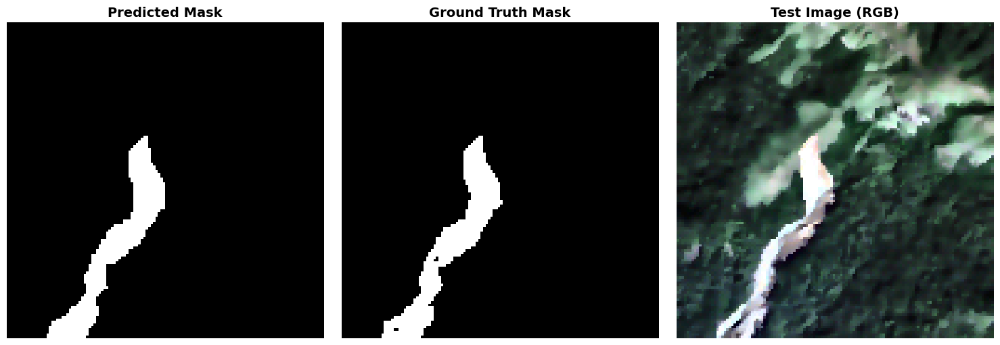


Sample #178


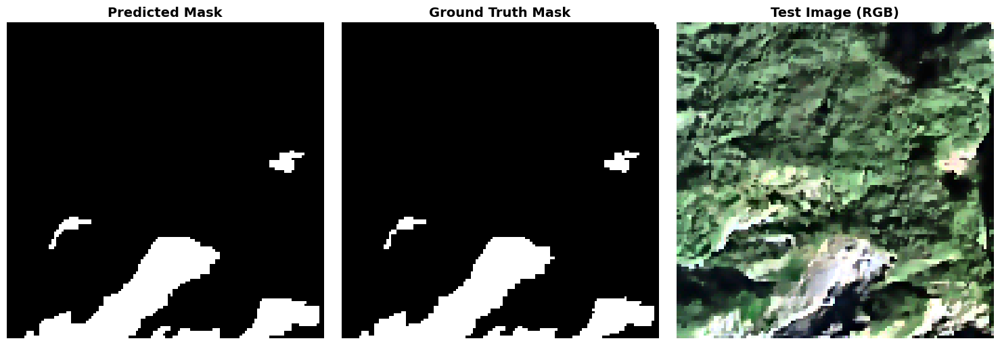


Sample #154


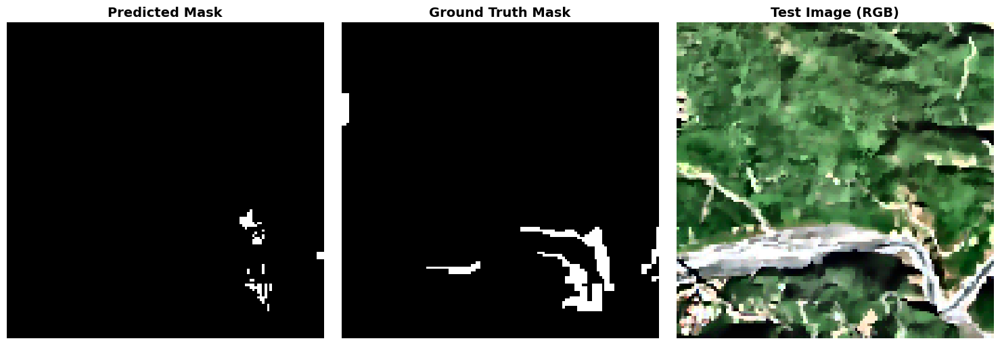

In [17]:
def visualize_prediction(sample_idx):
    """Visualize prediction for a single test sample."""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(predictions_binary[sample_idx, :, :, 0], cmap='gray')
    axes[0].set_title("Predicted Mask", fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(y_test[sample_idx, :, :, 0], cmap='gray')
    axes[1].set_title("Ground Truth Mask", fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(x_test[sample_idx, :, :, :3])
    axes[2].set_title("Test Image (RGB)", fontsize=14, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize multiple samples
for idx in [320, 178, 154]:
    print(f"\nSample #{idx}")
    visualize_prediction(idx)

## Cell 15: IoU Metrics

In [3]:
# Compute IoU for a single image
def compute_iou_single(y_true, y_pred):
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    iou = intersection / union if union != 0 else 0
    return iou

sample_idx = 320 # Same index as visualization
iou_score = compute_iou_single(y_test[sample_idx, :, :, 0], predictions_binary[sample_idx, :, :, 0])
print(f"IoU Score for Sample {sample_idx}: {iou_score:.4f}")

sample_idx = 178 # Same index as visualization
iou_score = compute_iou_single(y_test[sample_idx, :, :, 0], predictions_binary[sample_idx, :, :, 0])
print(f"IoU Score for Sample {sample_idx}: {iou_score:.4f}")

sample_idx = 154 # Same index as visualization
iou_score = compute_iou_single(y_test[sample_idx, :, :, 0], predictions_binary[sample_idx, :, :, 0])
print(f"IoU Score for Sample {sample_idx}: {iou_score:.4f}")

IoU Score for Sample 320: 0.9418

IoU Score for Sample 320: 0.9656

IoU Score for Sample 320: 0.6015



In [1]:
# Compute Mean IoU for the entire test set
def compute_mean_iou(y_true, y_pred):
    num_samples = y_true.shape[0]
    iou_scores = []
    for i in range(num_samples):
        iou = compute_iou_single(y_true[i, :, :, 0], y_pred[i, :, :, 0])
        iou_scores.append(iou)
    return np.mean(iou_scores)

mean_iou = compute_mean_iou(y_test, predictions_binary)
print(f"Mean IoU Score on Test Set: {mean_iou:.4f}")

Mean IoU Score on Test Set: 0.8429


## Cell 16: Plot Training History

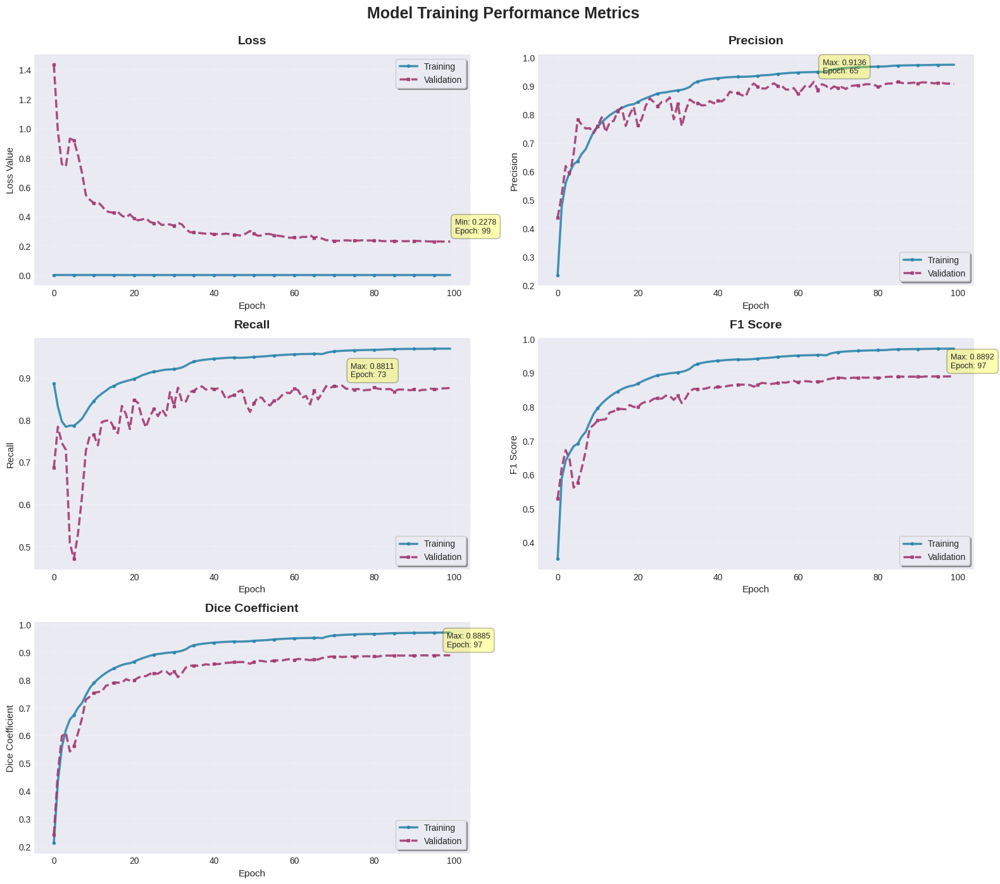

✓ Training history plotted


In [20]:
import seaborn as sns

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

fig, axes = plt.subplots(3, 2, figsize=(16, 14))
fig.suptitle('Model Training Performance Metrics', fontsize=18, fontweight='bold', y=0.995)

# Color scheme
train_color = '#2E86AB'
val_color = '#A23B72'
train_style = {'color': train_color, 'linewidth': 2.5, 'alpha': 0.9}
val_style = {'color': val_color, 'linewidth': 2.5, 'linestyle': '--', 'alpha': 0.9}

# Metrics to plot
metrics = [
    ('loss', 'Loss', 'Loss Value', 'upper right'),
    ('precision_m', 'Precision', 'Precision', 'lower right'),
    ('recall_m', 'Recall', 'Recall', 'lower right'),
    ('f1_m', 'F1 Score', 'F1 Score', 'lower right'),
    ('dice_coef', 'Dice Coefficient', 'Dice Coefficient', 'lower right'),
]

for idx, (metric, title, ylabel, legend_loc) in enumerate(metrics):
    row = idx // 2
    col = idx % 2
    ax = axes[row, col]
    
    if metric in history.history:
        # Plot training
        ax.plot(history.history[metric], **train_style, 
                label='Training', marker='o', markersize=3, markevery=5)
        
        # Plot validation
        val_metric = f'val_{metric}'
        if val_metric in history.history:
            ax.plot(history.history[val_metric], **val_style, 
                    label='Validation', marker='s', markersize=3, markevery=5)
        
        ax.set_title(title, fontsize=14, fontweight='bold', pad=12)
        ax.set_ylabel(ylabel, fontsize=11)
        ax.set_xlabel('Epoch', fontsize=11)
        ax.legend(loc=legend_loc, frameon=True, shadow=True, fancybox=True, fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.3, linewidth=0.8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Annotate best epoch
        if val_metric in history.history:
            val_data = history.history[val_metric]
            if metric == 'loss':
                best_epoch = np.argmin(val_data)
                best_value = np.min(val_data)
                text = f'Min: {best_value:.4f}\nEpoch: {best_epoch+1}'
            else:
                best_epoch = np.argmax(val_data)
                best_value = np.max(val_data)
                text = f'Max: {best_value:.4f}\nEpoch: {best_epoch+1}'
            
            ax.annotate(text, xy=(best_epoch, best_value), 
                       xytext=(10, 10), textcoords='offset points',
                       bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.3),
                       fontsize=9, ha='left')

# Remove last subplot
fig.delaxes(axes[2, 1])

plt.tight_layout()
plt.show()
print("✓ Training history plotted")

## Cell 17: Classification Report & Confusion Matrix


[Classification Report]
              precision    recall  f1-score   support

  Background       1.00      1.00      1.00  22688666
   Landslide       0.93      0.90      0.92    740454

    accuracy                           0.99  23429120
   macro avg       0.96      0.95      0.96  23429120
weighted avg       0.99      0.99      0.99  23429120



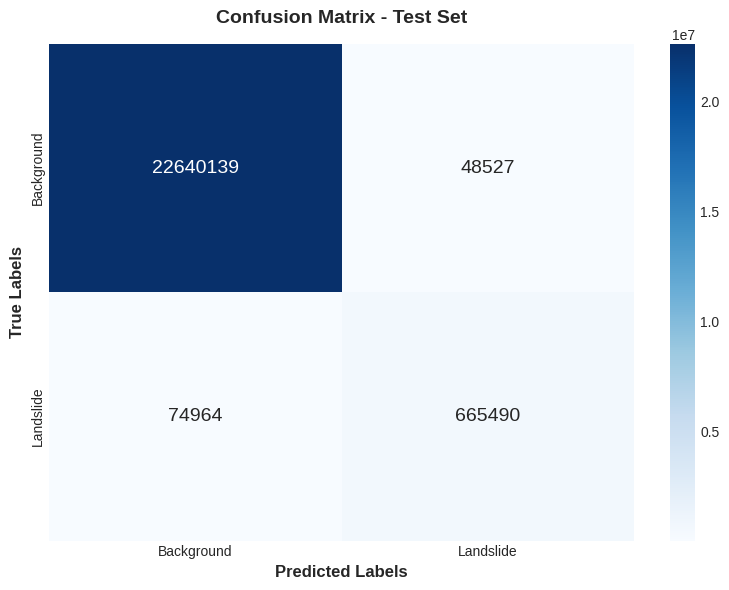

✓ Classification report and confusion matrix generated


In [21]:
from sklearn.metrics import classification_report, confusion_matrix

# Flatten predictions for pixel-wise classification
y_test_flat = y_test.flatten()
predictions_flat = predictions_binary.flatten()

# Classification report
print("\n[Classification Report]")
print(classification_report(y_test_flat, predictions_flat, 
                           target_names=['Background', 'Landslide']))

# Confusion matrix
cm = confusion_matrix(y_test_flat, predictions_flat)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=True,
            xticklabels=['Background', 'Landslide'],
            yticklabels=['Background', 'Landslide'],
            annot_kws={"fontsize": 14})
plt.xlabel('Predicted Labels', fontsize=12, fontweight='bold')
plt.ylabel('True Labels', fontsize=12, fontweight='bold')
plt.title('Confusion Matrix - Test Set', fontsize=14, fontweight='bold', pad=15)
plt.tight_layout()
plt.show()

print("✓ Classification report and confusion matrix generated")

In [ ]:
# XAI: Integrated Gradients for per-pixel, per-band attributions (robust version)
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import math

# Match the stacking you built in Cell 2
CHANNEL_NAMES = ["R","G","B","NDVI","slope","elevation","SWIR1","SWIR2"]

def integrated_gradients_seg(model, x, m_steps=32, baseline=None, mask_threshold=0.5):
    """
    Robust IG: interpolate each step on-the-fly (no slicing of a prebuilt tensor),
    which prevents None gradients on some TF builds / saved models.

    Args:
      model: Keras model whose single output is the landslide mask prob (B,H,W,1)
      x: np.ndarray or tf.Tensor of shape (1,H,W,C), same scaling as training
      m_steps: integration steps
      baseline: if None -> zeros (same shape as x)
      mask_threshold: binarization for aggregation region

    Returns:
      attributions (H,W,C), ch_importance (C,), mask_prob (H,W,1), mask_bin (H,W,1)
    """
    x = tf.convert_to_tensor(x, dtype=tf.float32)
    if baseline is None:
        baseline = tf.zeros_like(x)

    # Predict once to define where to aggregate
    preds = model(x, training=False)
    mask_prob = tf.squeeze(preds, axis=0)         # (H,W,1)
    mask_bin  = tf.cast(mask_prob > mask_threshold, tf.float32)

    # Prepare accumulation
    total_grads = tf.zeros_like(x, dtype=tf.float32)

    # Line integral via Riemann sum
    for alpha in tf.linspace(0.0, 1.0, m_steps):
        with tf.GradientTape() as tape:
            # Per-step interpolated input (watch this specific tensor)
            xi = baseline + alpha * (x - baseline)
            tape.watch(xi)

            out = model(xi, training=False)       # (1,H,W,1), sigmoid prob
            # Safe logit
            out = tf.clip_by_value(out, 1e-6, 1.0 - 1e-6)
            mask_logits = tf.math.log(out) - tf.math.log(1.0 - out)
            logits_2d = tf.squeeze(mask_logits, axis=0)  # (H,W,1)

            denom = tf.reduce_sum(mask_bin) + 1e-6
            obj = tf.reduce_sum(logits_2d * mask_bin) / denom  # scalar

        grads = tape.gradient(obj, xi)
        if grads is None:
            raise ValueError("Gradient is None; ensure the model output is differentiably connected to inputs.")
        total_grads += grads

    avg_grads = total_grads / float(m_steps)
    attributions = (x - baseline) * avg_grads          # (1,H,W,C)
    attributions = tf.squeeze(attributions, axis=0).numpy()

    ch_importance = np.abs(attributions).mean(axis=(0,1))
    return attributions, ch_importance, mask_prob.numpy(), mask_bin.numpy()

def show_per_band_heatmaps(attr_map, channel_names, use_abs=True):
    A = np.abs(attr_map) if use_abs else attr_map
    C = A.shape[-1]
    cols = 4
    rows = math.ceil(C/cols)
    vmax = np.percentile(A, 99)

    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3*rows))
    axes = axes.ravel() if hasattr(axes, "ravel") else [axes]
    for i in range(C):
        axes[i].imshow(A[..., i], cmap="magma", vmin=0, vmax=vmax)
        axes[i].set_title(f"{channel_names[i]} (IG)")
        axes[i].axis("off")
    for j in range(i+1, rows*cols):
        axes[j].axis("off")
    plt.tight_layout()
    plt.show()

def plot_xai_panel(x_rgb_like, pred_mask, attr_map, ch_scores, channel_names, vmax=None):
    spatial_attr = np.abs(attr_map).sum(axis=2)

    fig = plt.figure(figsize=(12,6))
    gs = fig.add_gridspec(2, 3)

    ax1 = fig.add_subplot(gs[0,0]); ax1.imshow(x_rgb_like); ax1.set_title("RGB"); ax1.axis('off')
    ax2 = fig.add_subplot(gs[0,1]); ax2.imshow(pred_mask[...,0], cmap='magma'); ax2.set_title("Predicted mask (prob)"); ax2.axis('off')
    ax3 = fig.add_subplot(gs[0,2]); ax3.imshow(spatial_attr, cmap='viridis', vmax=vmax); ax3.set_title("IG spatial attribution"); ax3.axis('off')

    ax4 = fig.add_subplot(gs[1,:])
    order = np.argsort(ch_scores)[::-1]
    ax4.bar([channel_names[i] for i in order], ch_scores[order])
    ax4.set_title("Channel importance (IG)")
    ax4.set_ylabel("mean |attribution|")
    plt.tight_layout(); plt.show()

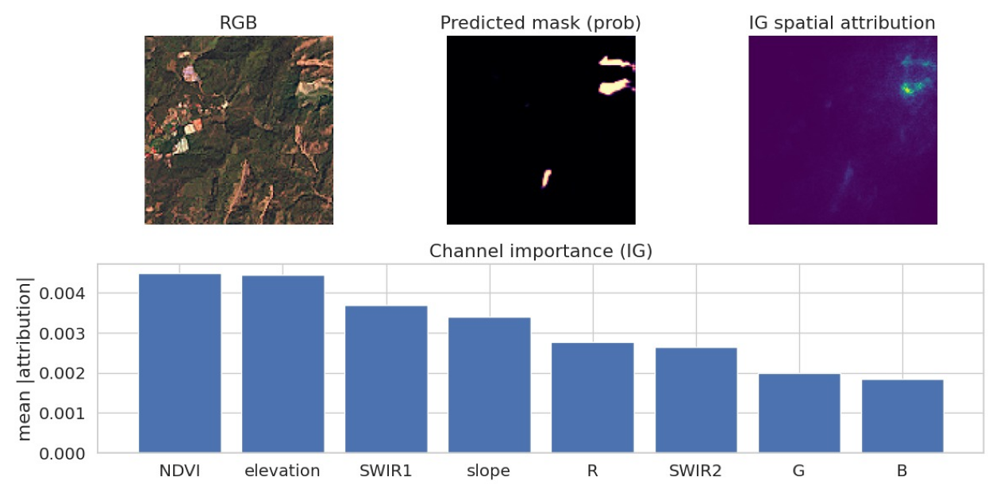

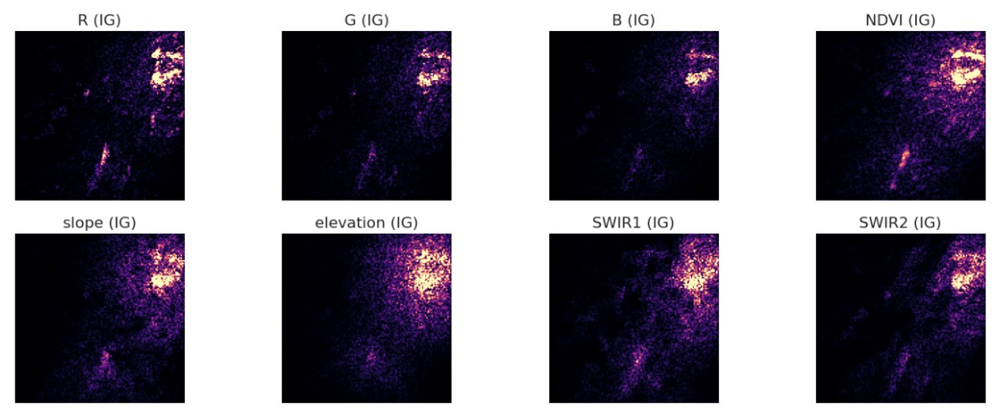

In [5]:
# Use the model from the 3rd boosting round, as per your screenshot
import tensorflow as tf
import numpy as np
import os

# Prefer the final model from round 3; fall back to best_model_3 if needed
MODEL_CANDIDATES = [
    "/kaggle/working/final_model_3.keras",
    "/kaggle/working/best_model_3.keras",
    "final_model_3.keras",
    "best_model_3.keras",
]

model_path = None
for p in MODEL_CANDIDATES:
    if os.path.exists(p):
        model_path = p
        break

if model_path is None:
    raise FileNotFoundError("Could not find final_model_3.keras or best_model_3.keras under /kaggle/working/")

# Load for inference; compile not required for gradients through the forward graph
ig_model = tf.keras.models.load_model(model_path, compile=False)

# ---- Pick a test sample to explain ----
idx = 5  # change to any valid index in [0, len(x_test))
x_patch = x_test[idx]         # (H,W,C)
y_patch = y_test[idx]         # (H,W,1)
x_in    = x_patch[None, ...].astype('float32')

# ---- Run IG ----
attr_map, ch_scores, mask_prob, mask_bin = integrated_gradients_seg(
    ig_model, x_in, m_steps=32, mask_threshold=0.5
)

# ---- Build RGB for display (Cell 2 stacking: [R,G,B,NDVI,slope,elev,SWIR1,SWIR2]) ----
r = x_patch[..., 0]; g = x_patch[..., 1]; b = x_patch[..., 2]
rgb = np.stack([r,g,b], axis=-1)
rgb = np.clip((rgb - rgb.min()) / (rgb.ptp() + 1e-6), 0, 1)

# ---- Show compact panel ----
plot_xai_panel(rgb, mask_prob, attr_map, ch_scores, CHANNEL_NAMES)

# ---- Also: one heatmap per spectral band ----
show_per_band_heatmaps(attr_map, CHANNEL_NAMES, use_abs=True)

In [ ]:
# ============================================================
# ============ Adaptive Fuzzy Logic (Mamdani-based) ==========
# ============================================================

import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt

# ---- Load best trained model ----
model_path = "best_model_1.keras"  # change if needed
model = load_model(model_path, compile=False)
print(f"✅ Loaded trained model from: {model_path}")

# ---- Fuzzy Membership Functions ----
def trapmf(x, a, b, c, d):
    """Trapezoidal membership function."""
    return np.maximum(np.minimum(np.minimum((x - a) / (b - a + 1e-8), 1.0), (d - x) / (d - c + 1e-8)), 0.0)

def trimf(x, a, b, c):
    """Triangular membership function."""
    return np.maximum(np.minimum((x - a) / (b - a + 1e-8), (c - x) / (c - b + 1e-8)), 0.0)


# ---- Adaptive threshold computation ----
def get_adaptive_thresholds(feature):
    """
    Dynamically compute fuzzy boundaries based on feature distribution.
    Uses quantiles to adapt to dataset range.
    """
    q = np.quantile(feature, [0.05, 0.25, 0.5, 0.75, 0.95])
    return {
        "low":  (q[0], q[0], q[1], q[2]),
        "med":  (q[1], q[2], q[3]),
        "high": (q[2], q[3], q[4], 1.0)
    }


# ---- Fuzzy Risk Map Function ----
def fuzzy_risk_map(tile: np.ndarray):
    """
    Adaptive Mamdani fuzzy inference for landslide risk estimation.
    Membership thresholds are computed per-tile from feature distributions.
    """
    ndvi = tile[..., 3]
    slope = tile[..., 4]
    elev  = tile[..., 5]
    sw1   = tile[..., 6]
    sw2   = tile[..., 7]
    moist = np.clip(1.0 - 0.5 * (sw1 + sw2), 0.0, 1.0)

    # Compute adaptive thresholds
    ndvi_thr  = get_adaptive_thresholds(ndvi)
    slope_thr = get_adaptive_thresholds(slope)
    elev_thr  = get_adaptive_thresholds(elev)
    moist_thr = get_adaptive_thresholds(moist)

    # Membership functions (adaptive)
    ndvi_low  = trapmf(ndvi, *ndvi_thr["low"])
    ndvi_med  = trimf(ndvi, *ndvi_thr["med"])
    ndvi_high = trapmf(ndvi, *ndvi_thr["high"])

    slope_g   = trapmf(slope, *slope_thr["low"])
    slope_m   = trimf(slope, *slope_thr["med"])
    slope_s   = trapmf(slope, *slope_thr["high"])

    elev_low  = trapmf(elev, *elev_thr["low"])
    elev_med  = trimf(elev, *elev_thr["med"])
    elev_high = trapmf(elev, *elev_thr["high"])

    moist_dry = trapmf(moist, *moist_thr["low"])
    moist_med = trimf(moist, *moist_thr["med"])
    moist_wet = trapmf(moist, *moist_thr["high"])

    # Fuzzy rules
    r1 = np.minimum(slope_s, moist_wet)
    r2 = np.minimum(slope_s, ndvi_low)
    r3 = np.minimum(ndvi_low, moist_wet)
    r4 = np.minimum.reduce([slope_m, ndvi_low, moist_med])
    high = np.maximum.reduce([r1, r2, r3, r4])

    m1 = np.minimum.reduce([slope_m, ndvi_med, moist_med])
    m2 = np.minimum.reduce([slope_s, ndvi_med, moist_dry])
    m3 = np.minimum.reduce([slope_g, moist_wet, elev_low])
    med = np.maximum.reduce([m1, m2, m3])

    l1 = np.minimum.reduce([slope_g, ndvi_high, moist_dry])
    l2 = np.minimum.reduce([slope_g, elev_high, ndvi_high])
    low = np.maximum(l1, l2)

    # Defuzzification
    c_low, c_med, c_high = 0.20, 0.50, 0.85
    denom = (low + med + high) + 1e-8
    risk = (c_low * low + c_med * med + c_high * high) / denom
    return np.clip(risk, 0.0, 1.0)


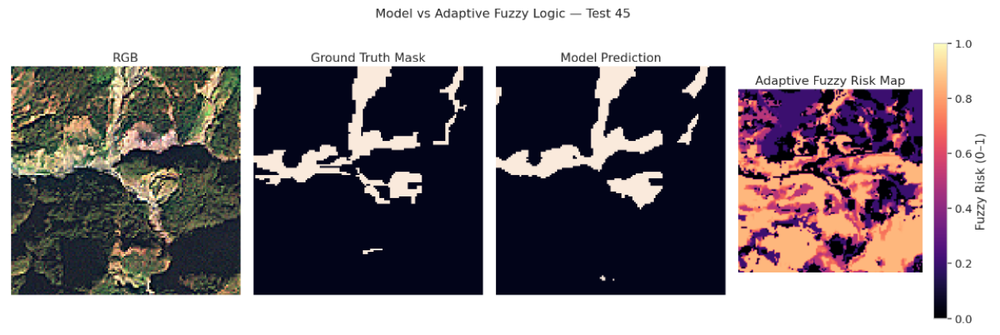

In [4]:
# ============================================================
# ======= Compare Model Segmentation vs Fuzzy Risk Map =======
# ============================================================

# Choose test index
idx = 0  # change index to visualize others
x_tile = x_test[idx]
y_true = y_test[idx, ..., 0]

# Model prediction
y_pred_prob = model.predict(x_tile[None, ...], verbose=0)[0, ..., 0]
y_pred_bin = (y_pred_prob > 0.5).astype(float)

# Fuzzy logic (adaptive)
risk_map = fuzzy_risk_map(x_tile)

# Visualization
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 1)
plt.imshow(np.clip(x_tile[..., :3], 0, 1))
plt.title("RGB"); plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(y_true, vmin=0, vmax=1)
plt.title("Ground Truth Mask"); plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(y_pred_bin, vmin=0, vmax=1)
plt.title("Model Prediction"); plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(risk_map, cmap='magma', vmin=0, vmax=1)
plt.colorbar(label='Fuzzy Risk (0–1)')
plt.title("Adaptive Fuzzy Risk Map"); plt.axis('off')

plt.suptitle(f"Model vs Adaptive Fuzzy Logic — Test {idx}", fontsize=16)
plt.tight_layout()
plt.show()


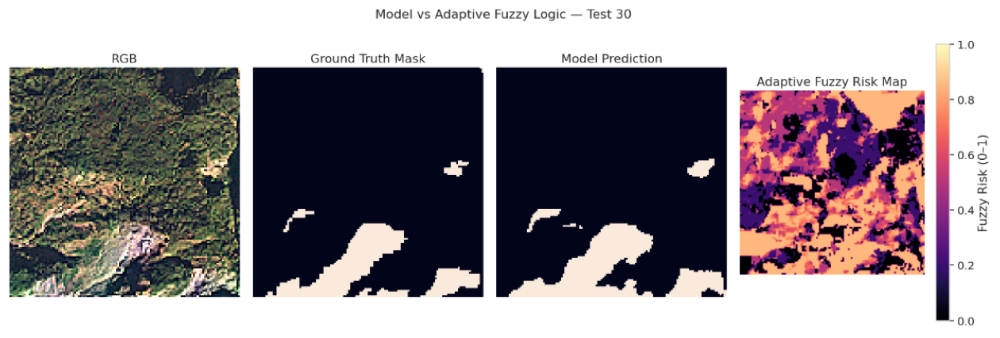

In [5]:
# ============================================================
# ======= Compare Model Segmentation vs Fuzzy Risk Map =======
# ============================================================

# Choose test index
idx = 45  # change index to visualize others
x_tile = x_test[idx]
y_true = y_test[idx, ..., 0]

# Model prediction
y_pred_prob = model.predict(x_tile[None, ...], verbose=0)[0, ..., 0]
y_pred_bin = (y_pred_prob > 0.5).astype(float)

# Fuzzy logic (adaptive)
risk_map = fuzzy_risk_map(x_tile)

# Visualization
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 1)
plt.imshow(np.clip(x_tile[..., :3], 0, 1))
plt.title("RGB"); plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(y_true, vmin=0, vmax=1)
plt.title("Ground Truth Mask"); plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(y_pred_bin, vmin=0, vmax=1)
plt.title("Model Prediction"); plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(risk_map, cmap='magma', vmin=0, vmax=1)
plt.colorbar(label='Fuzzy Risk (0–1)')
plt.title("Adaptive Fuzzy Risk Map"); plt.axis('off')

plt.suptitle(f"Model vs Adaptive Fuzzy Logic — Test {idx}", fontsize=16)
plt.tight_layout()
plt.show()
